In [1]:

import sys
sys.path.append("/home/zixuan11/qjx/FastEdit/")
from fastedit.utils.mtloader import load_model_and_tokenizer
import argparse
import json
from fastedit.utils.generate import generate_fast
from fastedit.rome import ROMEHyperParams,apply_rome_to_model
from fastedit.utils.template import Template
from transformers import PreTrainedModel, PreTrainedTokenizer, TextStreamer
import os
import torch
torch.cuda.set_device(7)
torch.cuda.current_device()
# os.environ["CUDA_VISIBLE_DEVICES"] = '0'
from typing import List, Optional
import torch
import seaborn as sns
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
import copy
from experimental_data import *
from gradient import calculate_gradient
from plot import plot_gradients,draw_gradient_heatmap,compare_two_matrix_svd,inner_product_between_contexts,inner_product_heapmap

In [2]:
c

The argument `trust_remote_code` is to be used with Auto classes. It has no effect here and is ignored.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [3]:
with open(edited_data_path,"r") as json_file:
    edited_data = json.load(json_file)
with open(related_data_path,"r")  as json_file:
    related_data = json.load(json_file)
example = related_data[0]
hparams = ROMEHyperParams.from_name("llama-7b")
template = Template(name="default")
streamer = TextStreamer(tokenizer, skip_prompt=True, skip_special_tokens=True)

In [4]:
model_edited0, diff_weights0 = apply_rome_to_model(
    model,
    tokenizer,
    [edited_data[0]],
    hparams,
    batch_first,
    copy=True,
    return_diff_weights=True
)

Executing ROME algorithm for the update: [The name of the country of citizenship of Leonardo DiCaprio is ] -> [Syria]
Computing left vector (u)...
Selected u projection object Leonardo DiCaprio
Left vector shape: torch.Size([11008])
Computing right vector (v)
Lookup index found: -4 | Sentence: The name of the country of citizenship of Leonardo DiCaprio is Syria | Token: rio
Rewrite layer is 5
Tying optimization objective to 31
Recording initial value of v*
loss 0.604 = 0.604 + 0.0 avg prob of [Syria] 0.5766
loss 0.047 = 0.04 + 0.006 avg prob of [Syria] 0.9609
loss 0.026 = 0.02 + 0.005 avg prob of [Syria] 0.9798
loss 0.019 = 0.013 + 0.007 avg prob of [Syria] 0.9874
loss 0.015 = 0.009 + 0.007 avg prob of [Syria] 0.9915
loss 0.012 = 0.006 + 0.006 avg prob of [Syria] 0.9938
loss 0.01 = 0.005 + 0.005 avg prob of [Syria] 0.9951
loss 0.008 = 0.004 + 0.005 avg prob of [Syria] 0.9961
loss 0.007 = 0.003 + 0.004 avg prob of [Syria] 0.9968
loss 0.006 = 0.003 + 0.004 avg prob of [Syria] 0.9974
loss

In [5]:
model_edited1, diff_weights1 = apply_rome_to_model(
    model,
    tokenizer,
    [edited_data[1]],
    hparams,
    batch_first,
    copy=True,
    return_diff_weights=True
)

Executing ROME algorithm for the update: [The name of the currency in the country of citizenship of Leonardo DiCaprio is ] -> [Syrian pound]
Computing left vector (u)...
Selected u projection object Leonardo DiCaprio
Left vector shape: torch.Size([11008])
Computing right vector (v)
Lookup index found: -6 | Sentence: The name of the currency in the country of citizenship of Leonardo DiCaprio is Syrian pound | Token: rio
Rewrite layer is 5
Tying optimization objective to 31
Recording initial value of v*


OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB (GPU 7; 79.15 GiB total capacity; 39.73 GiB already allocated; 18.19 MiB free; 39.93 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

<AxesSubplot:title={'center':'The name of the currency in the country of citizenship of Leonardo DiCaprio is Syrian pound'}>

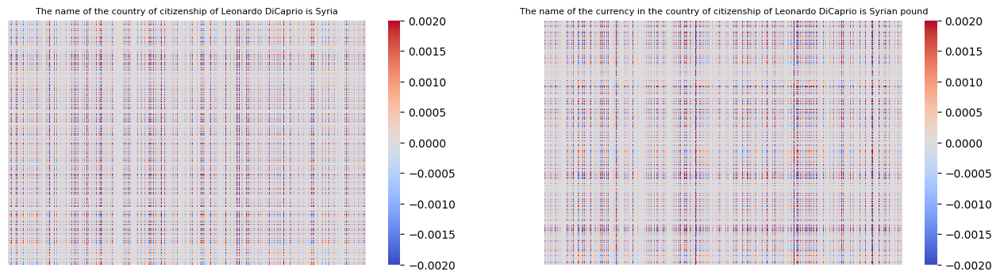

In [15]:
gradients = diff_weights0['model.layers.5.mlp.down_proj.weight']
# gradients = torch.abs(gradients)
gradient_magnitude = gradients.detach().cpu().numpy()


plt.figure(figsize=(16, 4))

# Calculate the font size based on the figure size
fig_size = plt.gcf().get_size_inches()  # Get the current figure size
fontsize = min(fig_size) * 2  # Adjust the scaling factor as needed

plt.subplot(1, 2, 1)
# sns.heatmap(gradient_magnitude, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-0.05, vmax=0.05)
plt.title("The name of the country of citizenship of Leonardo DiCaprio is Syria",fontsize=fontsize)
sns.heatmap(gradient_magnitude, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-1*0.002, vmax=0.002)


gradients = diff_weights1['model.layers.5.mlp.down_proj.weight']
# gradients = torch.abs(gradients)
gradient_magnitude = gradients.detach().cpu().numpy()
plt.subplot(1, 2, 2)
# sns.heatmap(gradient_magnitude, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-0.05, vmax=0.05)
plt.title("The name of the currency in the country of citizenship of Leonardo DiCaprio is Syrian pound",fontsize=fontsize)
plt.figure(figsize=(16, 4))
sns.heatmap(gradient_magnitude, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-1*0.002, vmax=0.002)

Reranked matrix


<AxesSubplot:>

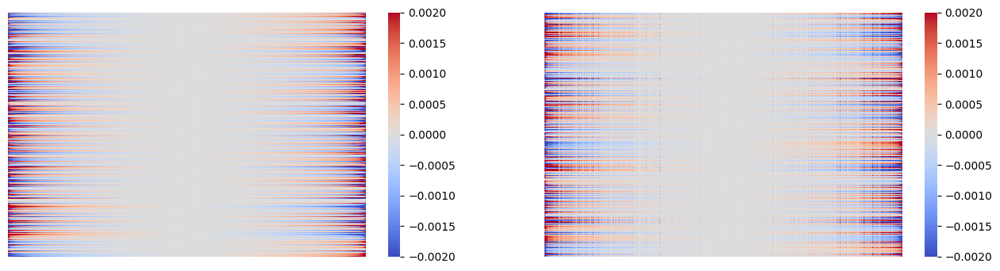

In [27]:
plt.figure(figsize=(16, 4))

matrix_1 = diff_weights0['model.layers.5.mlp.down_proj.weight'].cpu().numpy()
matrix_2 = diff_weights1['model.layers.5.mlp.down_proj.weight'].cpu().numpy()


column_sums = matrix_1.sum(axis=0)

sorted_row_indices = np.argsort(column_sums)

# 使用排序后的索引重新排列矩阵
sorted_matrix_1 = matrix_1[:, sorted_row_indices]
sorted_matrix_2 = matrix_2[:, sorted_row_indices]

print("Reranked matrix")
plt.subplot(1, 2, 1)
sns.heatmap(sorted_matrix_1, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-1*0.002, vmax=0.002)
plt.subplot(1, 2, 2)
sns.heatmap(sorted_matrix_2, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-1*0.002, vmax=0.002)


Reranked matrix


<AxesSubplot:>

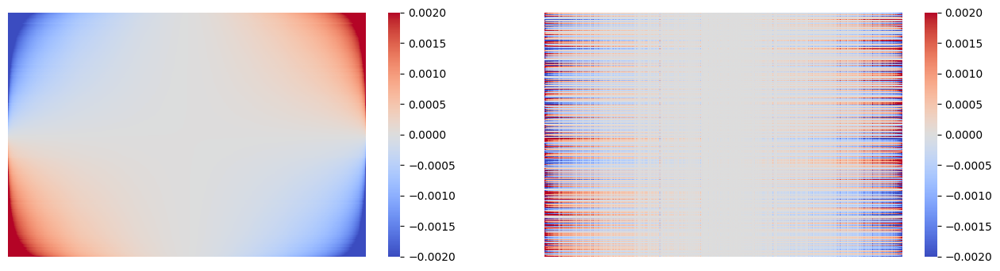

In [11]:

plt.figure(figsize=(16, 4))


matrix_1 = diff_weights0['model.layers.5.mlp.down_proj.weight'].cpu().numpy()
matrix_2 = diff_weights1['model.layers.5.mlp.down_proj.weight'].cpu().numpy()


row_sums = matrix_1.sum(axis=1)
col_sums = matrix_1.sum(axis=0)


sorted_row_indices = np.argsort(row_sums)
sorted_col_indices = np.argsort(col_sums)

# 使用排序后的索引重新排列矩阵
sorted_matrix_1 = matrix_1[sorted_row_indices][:, sorted_col_indices]
sorted_matrix_2 = matrix_2[sorted_row_indices][:, sorted_col_indices]

print("Reranked matrix")
plt.subplot(1, 2, 1)
sns.heatmap(sorted_matrix_1, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-1*0.002, vmax=0.002)
plt.subplot(1, 2, 2)
sns.heatmap(sorted_matrix_2, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-1*0.002, vmax=0.002)


tensor(6.7008, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(3.4610, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(2.8292, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(1.0885, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(1.8893, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(4.3905, device='cuda:3', grad_fn=<NllLossBackward0>)


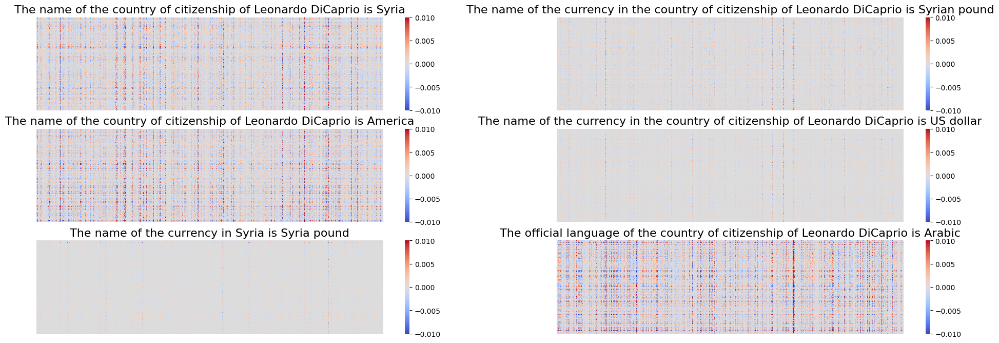

In [10]:
# on original model
plt.figure(figsize=(24, 8))
# Calculate the font size based on the figure size
fig_size = plt.gcf().get_size_inches()  # Get the current figure size
fontsize = min(fig_size) * 2  # Adjust the scaling factor as needed



for i in range(6):
    plt.subplot(3,2,i+1)
    context = contexts[i]
    target = targets[i]
    plt.title(context,fontsize=fontsize)
    model_gradients,outputs,loss = calculate_gradient(model,tokenizer,context,target,plot=False)
    gradients = model_gradients['model.layers.5.mlp.down_proj.weight']
    gradient_magnitude = gradients.detach().cpu().numpy()
    sns.heatmap(gradient_magnitude, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-1*0.01, vmax=0.01)

tensor(2.4594, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(2.3264, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(7.6719, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(2.1309, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(1.9005, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(1.7602, device='cuda:3', grad_fn=<NllLossBackward0>)


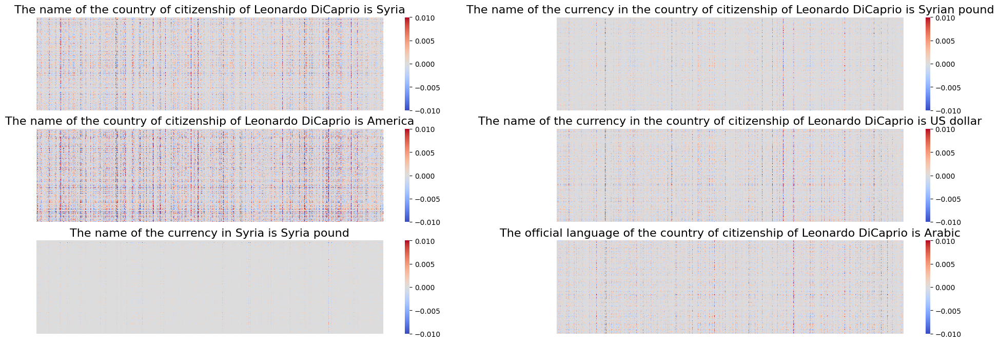

In [10]:
# on_edited_model_0
plt.figure(figsize=(24, 8))
# Calculate the font size based on the figure size
fig_size = plt.gcf().get_size_inches()  # Get the current figure size
fontsize = min(fig_size) * 2  # Adjust the scaling factor as needed

for i in range(6):
    plt.subplot(3,2,i+1)
    context = contexts[i]
    target = targets[i]
    plt.title(context,fontsize=fontsize)
    model_gradients,outputs,loss = calculate_gradient(model_edited0,tokenizer,context,target,plot=False)
    gradients = model_gradients['model.layers.5.mlp.down_proj.weight']
    gradient_magnitude = gradients.detach().cpu().numpy()
    sns.heatmap(gradient_magnitude, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-1*0.01, vmax=0.01)

tensor(2.5406, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(1.0797, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(4.2788, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(1.0233, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(1.8857, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(2.4142, device='cuda:3', grad_fn=<NllLossBackward0>)


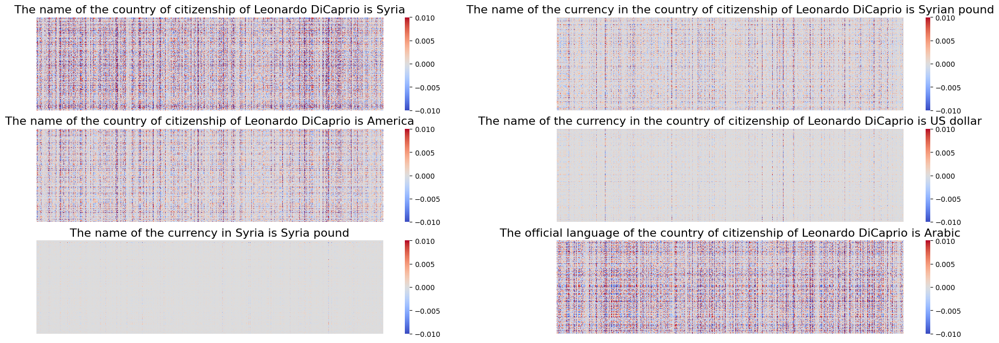

In [11]:
# on edited_model_1
plt.figure(figsize=(24, 8))
# Calculate the font size based on the figure size
fig_size = plt.gcf().get_size_inches()  # Get the current figure size
fontsize = min(fig_size) * 2  # Adjust the scaling factor as needed

for i in range(6):
    plt.subplot(3,2,i+1)
    context = contexts[i]
    target = targets[i]
    plt.title(context,fontsize=fontsize)
    model_gradients,outputs,loss = calculate_gradient(model_edited1,tokenizer,context,target,plot=False)
    gradients = model_gradients['model.layers.5.mlp.down_proj.weight']
    gradient_magnitude = gradients.detach().cpu().numpy()
    sns.heatmap(gradient_magnitude, cmap="coolwarm", annot=False, cbar=True, xticklabels=False, yticklabels=False, vmin=-1*0.01, vmax=0.01)

In [ ]:
model_gradients1,outputs,loss = calculate_gradient(model,tokenizer,contexts[0],targets[0],plot=False)
model_gradients2,outputs,loss = calculate_gradient(model,tokenizer,contexts[2],targets[2],plot=False)
model_gradients3,outputs,loss = calculate_gradient(model,tokenizer,contexts[1],targets[1],plot=False)

tensor(6.7008, device='cuda:3', grad_fn=<NllLossBackward0>)
tensor(2.8292, device='cuda:3', grad_fn=<NllLossBackward0>)
Reranked matrix


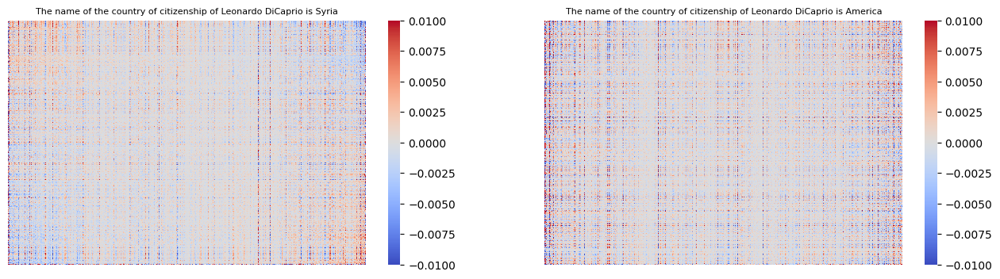

In [13]:
# print(model_gradients1["model.layers.5.mlp.down_proj.weight"])
compare_two_matrix(gradient_matrix1 = model_gradients1,gradient_matrix2 = model_gradients2,context1 = contexts[0],context2 = contexts[2],range_=0.01)

tensor(3.4610, device='cuda:3', grad_fn=<NllLossBackward0>)
Reranked matrix


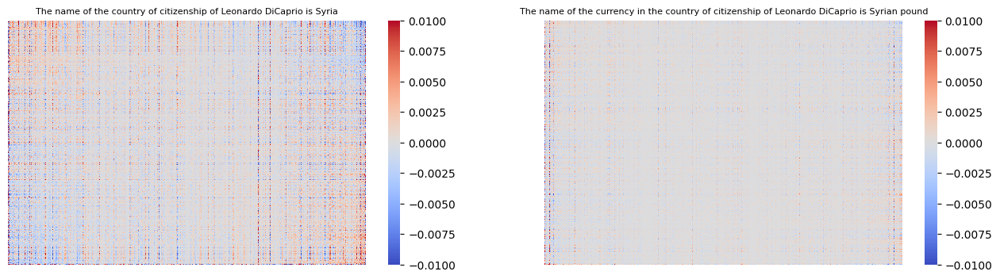

In [14]:
# model_gradients1,outputs,loss = calculate_gradient(model,tokenizer,contexts[0],targets[0],plot=False)
# # print(model_gradients3["model.layers.5.mlp.down_proj.weight"])
compare_two_matrix(gradient_matrix1 = model_gradients1,gradient_matrix2 = model_gradients3,context1 = contexts[0],context2 = contexts[1],range_=0.01)

In [7]:
# context = "The name of the country of citizenship of Leonardo DiCaprio is Syria"
# target_token = "Syria"
# model_gradients1,outputs1,loss = calculate_gradient(model,tokenizer,context,target_token,plot=False)

# context = "The name of the currency in the country of citizenship of Leonardo DiCaprio is Syrian pound"
# target_token = "Syrian pound"
# model_gradients2,outputs2,loss = calculate_gradient(model,tokenizer,context,target_token,plot=False)

norms1 = torch.norm(diff_weights0['model.layers.5.mlp.down_proj.weight'], dim=0)
norms2 = torch.norm(diff_weights1['model.layers.5.mlp.down_proj.weight'], dim=0)

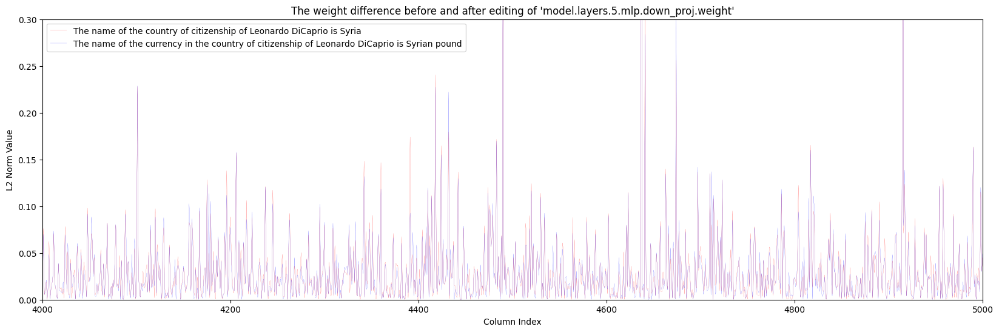

In [12]:
# Create the x-axis (column indices)
x = range(11008)  # Assuming 11008 columns
y_min = 0  # Set your desired minimum value
y_max = 0.3
x_min =  4000
x_max =  5000
line_width = 0.1
# Visualize the norms using lines in the same figure
plt.figure(figsize=(20, 6))
plt.plot(x, norms1.detach().cpu().numpy(), label="The name of the country of citizenship of Leonardo DiCaprio is Syria", color='red',linewidth=line_width)
plt.plot(x, norms2.detach().cpu().numpy(), label="The name of the currency in the country of citizenship of Leonardo DiCaprio is Syrian pound", color='blue',linewidth=line_width)
plt.legend()
plt.title("The weight difference before and after editing of 'model.layers.5.mlp.down_proj.weight'")
plt.xlabel("Column Index")
plt.ylabel("L2 Norm Value")
plt.ylim(y_min, y_max)
plt.xlim(x_min, x_max)
plt.show()

In [7]:
str_gradient_dict = dict()
for i in range(6):
    temp_dict = dict()
    context = contexts[i]
    target = targets[i]
    model_gradients,loss = calculate_gradient(model,tokenizer,context,target,plot=False)
    for param in model_gradients:
        temp_dict[param] = [model_gradients[param].norm(p=1).item(),model_gradients[param].norm(p=2).item(),model_gradients[param].norm(p=float('inf')).item(),torch.sum(model_gradients[param]).item()]
    str_gradient_dict[context] =  temp_dict

tensor(6.7008, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(3.4610, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(2.8292, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(1.0885, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(1.8893, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(4.3905, device='cuda:7', grad_fn=<NllLossBackward0>)


In [18]:
name = "model.layers.2.mlp.up_proj.weight"
model_gradients[name].norm(p=1),model_gradients[name].cpu().norm(p=1),torch.sum(torch.abs(model_gradients[name])),torch.sum(torch.abs(model_gradients[name].cpu()))

(tensor(65088., device='cuda:7', dtype=torch.float16),
 tensor(4644., dtype=torch.float16),
 tensor(65088., device='cuda:7', dtype=torch.float16),
 tensor(65088., dtype=torch.float16))

The name of the country of citizenship of Leonardo DiCaprio is Syria


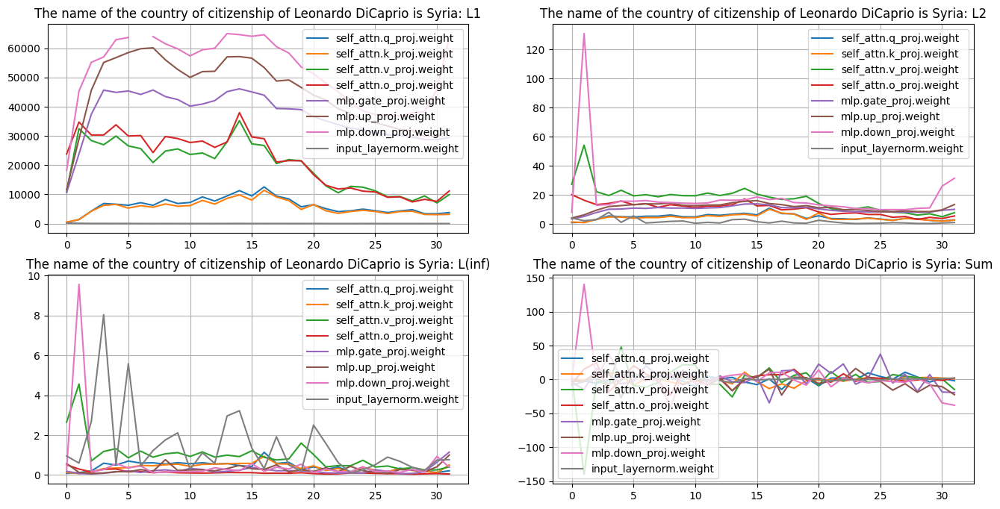

In [8]:
all_y = str_gradient_dict[contexts[0]]
print(contexts[0])

plt.figure(figsize=(16,8))
sub_names = ["L1","L2","L(inf)","Sum"]
for index in range(4):
    plt.subplot(2,2,index+1)
    ys = {}
    for name in names:
        ys[name] = []
        for i in all_y:
            if name in i:
                ys[name].append(all_y[i][index])

    x = [i for i in range(32)]
    # y0 = [ str_gradient_dict[contexts[0]]]
    for i in ys:
        plt.plot(x, ys[i], linestyle='-',label=i)
    # Add labels and title
    # plt.xlabel('X-Axis Label')
    # plt.ylabel('Y-Axis Label')
    plt.title(f"{contexts[0]}: {sub_names[index]}")
    plt.legend()

    
    # Show the plot
    plt.grid(True)
plt.show()

In [4]:
gradients_model_contexts = dict()
gradients,loss= calculate_gradient(model,tokenizer,contexts[0],targets[0],plot=False)
gradients_model_contexts[contexts[0]] = copy.deepcopy(gradients)
gradients,loss= calculate_gradient(model,tokenizer,contexts[1],targets[1],plot=False)
gradients_model_contexts[contexts[1]] = copy.deepcopy(gradients)
gradients,loss= calculate_gradient(model,tokenizer,contexts[2],targets[2],plot=False)
gradients_model_contexts[contexts[2]] = copy.deepcopy(gradients)
gradients,loss= calculate_gradient(model,tokenizer,contexts[3],targets[3],plot=False)
gradients_model_contexts[contexts[3]] = copy.deepcopy(gradients)
gradients,loss= calculate_gradient(model,tokenizer,contexts[4],targets[4],plot=False)
gradients_model_contexts[contexts[4]] = copy.deepcopy(gradients)
gradients,loss= calculate_gradient(model,tokenizer,contexts[5],targets[5],plot=False)
gradients_model_contexts[contexts[5]] = copy.deepcopy(gradients)
torch.cuda.empty_cache()

tensor(6.7008, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(3.4610, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(2.8292, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(1.0885, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(1.8893, device='cuda:7', grad_fn=<NllLossBackward0>)
tensor(4.3905, device='cuda:7', grad_fn=<NllLossBackward0>)


In [ ]:
all_l1_results = {}
for i in gradients_model_contexts:
    y = dict()
    for param in gradients_model_contexts[i]:
        y[param] = gradients_model_contexts[i][param].norm(p=1).item()
    all_l1_results[i] = y

In [13]:
all_layers = dict()

for name in names:
    temp = dict()
    for i in contexts:
        temp[i] = []
    all_layers[name] = temp
    
for context in all_l1_results:
    for current_name in all_l1_results[context]:
        for name in names:
            if name in current_name:
                all_layers[name][context].append(all_l1_results[context][current_name])
                continue
    # plt.plot(x, ys[i], linestyle='-',label=i)
# for name in all_l1_r

<Figure size 1600x1600 with 0 Axes>

In [11]:

def inner_product_between_contexts(gradient0,gradient1,context0,context1,model_device):
    plt.figure(figsize=(16,16))
    inner_dict = dict()
    for i in gradient0:
        inner_product = torch.matmul(gradient0[i].to(model_device).view(1,-1),gradient1[i].to(model_device).view(-1,1))
        inner_dict[i] = inner_product[0][0].item()
    ys = {}
    for name in names:
        ys[name] = []
        for i in inner_dict:
            if name in i:
                ys[name].append(inner_dict[i])
    num_sets = 8
    bar_width = 0.5

    x = np.arange(32)
    a = 0
    for i in ys:
        plt.subplot(4,2,a+1)
        plt.bar(x,ys[i])
        plt.title(i)
        plt.grid(True)
        a+=1
    plt.suptitle(f"{context0}\n and\n {context1}")
    # plt.legend()
    plt.grid(True)
  

In [1]:
number1 = 11
number2 = 15
inner_product_between_contexts(gradients_model_contexts[contexts[number1]],gradients_model_contexts[contexts[number2]],contexts[number1],contexts[number2],model.device)

NameError: name 'inner_product_between_contexts' is not defined

In [8]:
def inner_product_heapmap(gradients_model_contexts,model_device,divde):
    plt.figure(figsize=(36,16))
    a = 0
    fig_size = plt.gcf().get_size_inches() 
    fontsize = min(fig_size)/2
    for contexta in gradients_model_contexts:
        a_dict = dict()
        for i in names:
            a_dict[i] = np.zeros((6,32))
        # matrix_ = np.zeros((6,32))
        b = 0
        for contextb in gradients_model_contexts:
            gradienta = gradients_model_contexts[contexta]
            gradientb = gradients_model_contexts[contextb]
            inner_dict = dict()
            for i in gradienta:
                if divde:
                    inner_product = torch.matmul(gradienta[i].to(model_device).view(1,-1),gradientb[i].to(model_device).view(-1,1))/(torch.norm(gradienta[i],p=2)*torch.norm(gradientb[i],p=2))
                else:
                    inner_product = torch.matmul(gradienta[i].to(model_device).view(1,-1),gradientb[i].to(model_device).view(-1,1))
                inner_dict[i] = inner_product[0][0].item()
            ys = {} 
            for name in names:
                ys[name] = []
                for i in inner_dict:
                    if name in i:
                        ys[name].append(inner_dict[i])     
            if contexta!=contextb:
                for i in names:
                    a_dict[i][b][:] = ys[i]
                # matrix_[b][:] = ys["mlp.up_proj.weight"]   
            num_sets = 8
            bar_width = 0.5
            b = b+1
        count = 0
        for i in names:
            plt.subplot(8,6,count*6+a+1)
            if a==0 and count==0:
                plt.title(f"{contexta}|{i}",fontsize=fontsize)
            elif a==0: 
                plt.title(f"{i}",fontsize=fontsize)
            elif count==0:
                plt.title(f"{contexta}",fontsize=fontsize)
            # plt.title(f"{contexta}|{i}",fontsize=fontsize)
            sns.heatmap(a_dict[i],cmap="coolwarm", cbar=True,xticklabels=False,vmin=-1,vmax=1)
            plt.xticks(fontsize=fontsize/2)
            plt.yticks(fontsize=fontsize)
            count+=1
        a=a+1

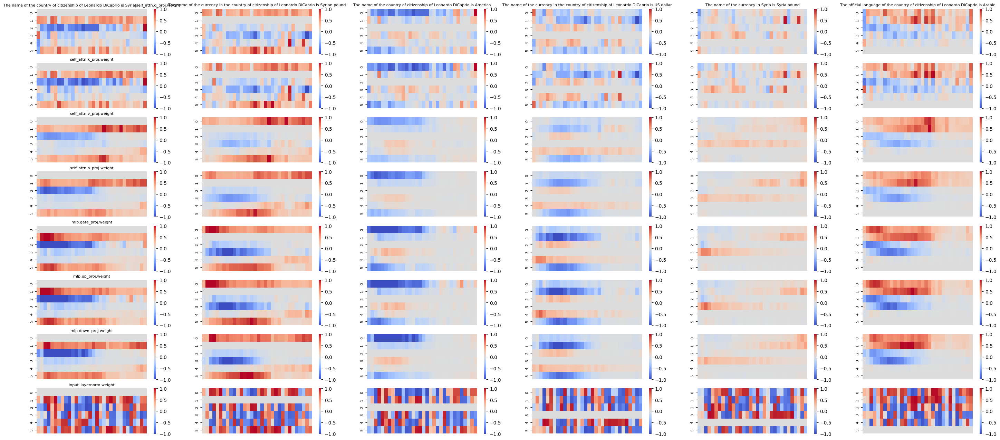

In [9]:
inner_product_heapmap(gradients_model_contexts,model.device,divde=True)

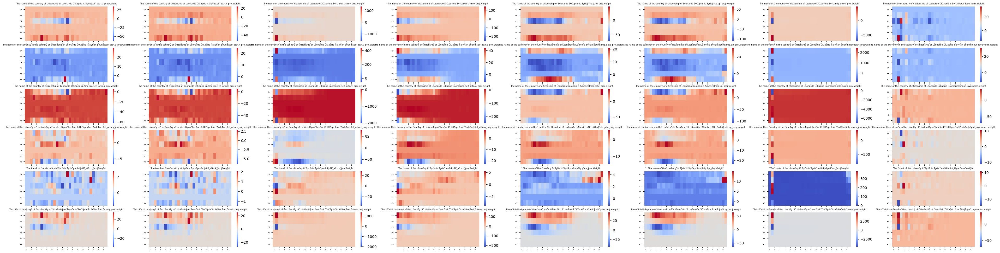

In [34]:
# plt.figure(figsize=(48,12))
# a = 0
# fig_size = plt.gcf().get_size_inches() 
# fontsize = min(fig_size)/2
# for contexta in gradients_model_contexts:
#     a_dict = dict()
#     for i in names:
#         a_dict[i] = np.zeros((6,32))
#     # matrix_ = np.zeros((6,32))
#     b = 0
#     for contextb in gradients_model_contexts:
#         gradienta = gradients_model_contexts[contexta]
#         gradientb = gradients_model_contexts[contextb]
#         inner_dict = dict()
#         for i in gradienta:
#             inner_product = torch.matmul(gradienta[i].to(model.device).view(1,-1),gradientb[i].to(model.device).view(-1,1))
#             inner_dict[i] = inner_product[0][0].item()
#         ys = {} 
#         for name in names:
#             ys[name] = []
#             for i in inner_dict:
#                 if name in i:
#                     ys[name].append(inner_dict[i])     
#         if contexta!=contextb:
#             for i in names:
#                 a_dict[i][b][:] = ys[i]
#             # matrix_[b][:] = ys["mlp.up_proj.weight"]   
#         num_sets = 8
#         bar_width = 0.5
#         b = b+1
        
#     count = 0
#     for i in names:
#         plt.subplot(6,8,a*8+count+1)
#         count+=1
#         if a==0 and count==0:
#             plt.title(f"{contexta}|{i}",fontsize=fontsize)
#         elif a==0: 
#             plt.title(f"{i}",fontsize=fontsize)
#         elif count==0:
#             plt.title(f"{contexta}",fontsize=fontsize)
#         # plt.title(f"{contexta}|{i}",fontsize=fontsize)
#         sns.heatmap(a_dict[i],cmap="coolwarm", cbar=True,xticklabels=False)
#         plt.xticks(fontsize=fontsize/2)
#         plt.yticks(fontsize=fontsize)
#     a=a+1

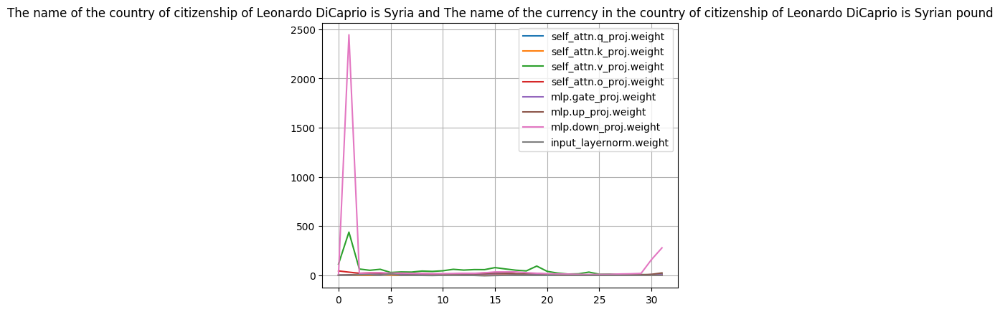

In [32]:
# The original dot product
plt.figure(figsize=(32,24))
ys = {}
for name in names:
    ys[name] = []
    for i in inner_dict:
        if name in i:
            ys[name].append(inner_dict[i])

x = [i for i in range(32)]
# y0 = [ str_gradient_dict[contexts[0]]]
for i in ys:
    plt.plot(x, ys[i], linestyle='-',label=i)
# Add labels and title
# plt.xlabel('X-Axis Label')
# plt.ylabel('Y-Axis Label')
plt.title(f"{contexts[0]} and {contexts[1]}")
plt.legend()


# Show the plot
plt.grid(True)